Hackathon: #bdthackathon

Autor: Julio Abril Cuesta


# 1. Introducción.

Este notebook es solución propuesta para el reto de Barcelona Digital Talent (#BDTHackaton) en la modalidad de data science.

Tenemos un conjunto de datos que representan las lecturas de los sensores del LHC (large hadron collider) cuando se produce una colisión de partículas y la partícula que se produce como consecuencia de esa colisión.

El objetivo del reto es **generar un algoritmo de machine learning** que ayude a **predecir que partícula** se ha producido después de una colisión de hadrones **a partir de la información recogida por los sensores del LHC**.


---


In [102]:
## Carga librerías


## Tratamiento de datos
##----------------------------------------------------------------
import pandas as pd
import numpy as np

import missingno as msno 

import pandas_profiling as pp

## Visualización de datos
##----------------------------------------------------------------
%matplotlib inline
import matplotlib.pyplot as plt

import seaborn as sns

## Model selection
##----------------------------------------------------------------
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

## Preprocesing
##----------------------------------------------------------------
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer, KNNImputer

## Linear Models
##----------------------------------------------------------------
from sklearn.linear_model import LogisticRegression

## Ensemble
##----------------------------------------------------------------
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

import xgboost as xgb 

from sklearn.pipeline import Pipeline

## Model evaluation
##----------------------------------------------------------------
from sklearn.metrics import f1_score, classification_report

## Imbalanced Learning
##----------------------------------------------------------------
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek, SMOTEENN


from joblib import dump, load


# 2. Análisis exploratorio.

## 2.1. Carga del dataset.

Cargo el dataset del repositorio de github

In [2]:
# Carga del dataset

df = pd.read_csv('https://raw.githubusercontent.com/nuwe-io/bdt_hackathon/main/particles.csv')

In [3]:
# Información df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127321 entries, 0 to 127320
Data columns (total 12 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   alpha_1   109132 non-null  float64
 1   alpha_2   127321 non-null  float64
 2   alpha_3   127321 non-null  float64
 3   beta_1    127321 non-null  float64
 4   beta_2    127131 non-null  float64
 5   beta_3    127206 non-null  float64
 6   gamma_1   127321 non-null  float64
 7   gamma_2   126594 non-null  float64
 8   gamma_3   117897 non-null  float64
 9   theta     126595 non-null  float64
 10  noise     127321 non-null  float64
 11  Particle  127321 non-null  int64  
dtypes: float64(11), int64(1)
memory usage: 11.7 MB


In [4]:
df.head()

,alpha_1,alpha_2,alpha_3,beta_1,beta_2,beta_3,gamma_1,gamma_2,gamma_3,theta,noise,Particle
0,NaN,-59.730861,396.928620,9.761703,-137.558889,159.598109,-137.558889,53.930955,154.713810,-232.436087,99.243140,3
1,147.781782,153.729532,111.998962,-174.941235,-97.888332,26.493593,-97.888332,-30.506871,-166.347802,-195.010710,20.242743,0
2,242.220616,82.947635,-102.073856,116.334349,-101.746729,176.452823,-101.746729,-33.419984,44.082548,-173.928682,3.806943,1
3,140.542086,-110.129037,215.560355,-11.927860,-11.257902,21.648833,-11.257902,240.685680,133.441269,-276.382025,0.336025,0
4,169.367809,-92.182925,159.995515,-272.230740,-80.483153,-97.698901,-80.483153,16.251613,-13.177148,-100.316959,24.459551,0


---

## 2.2. Análisis exploratorio.

La librería pandas profilling nos permite obtener de manera sencilla un informe con los valores estadísticos de nuestro dataset. A continuación ejecuto el código necesario:

---

In [6]:
# Genero profile report

df_report = pp.ProfileReport(df,
                             title = 'Dataset lecturas de sensores - LHC',
                             explorative = True)
df_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---

_(En ocasiones pandas profilling da algún error en google colab, así que incluiré algunos gráficos que se pueden encontrar en el report de pandas profilling para dar soporte a la hora de visualizar nuestros datos)_

### 2.2.1. Análisis univariable.

- Tenemos un dataset con 11 variables (features) numéricas que representan información sobre la lectura de los sensores y un campo objetivo (target) categórico con 8 clases que nos indica que partícula hemos obtenido en el esperimento.

- El dataset tiene 127.321 observaciones y no se observan campos duplicados.

---

In [15]:
# Registros duplicados
df[df.duplicated()].sum()

alpha_1     0.0
alpha_2     0.0
alpha_3     0.0
beta_1      0.0
beta_2      0.0
beta_3      0.0
gamma_1     0.0
gamma_2     0.0
gamma_3     0.0
theta       0.0
noise       0.0
Particle    0.0
dtype: float64

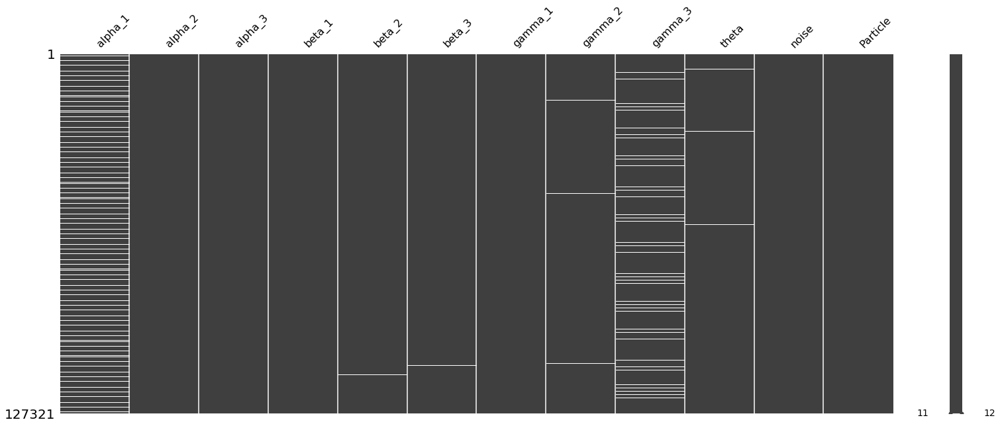

In [7]:
# Valores nulos
msno.matrix(df);

In [12]:
# Total de valores nulos por variable
df.isna().sum()

alpha_1     18189
alpha_2         0
alpha_3         0
beta_1          0
beta_2        190
beta_3        115
gamma_1         0
gamma_2       727
gamma_3      9424
theta         726
noise           0
Particle        0
dtype: int64

---

- Hay 29.371 valores nulos a los largo de nuestras features. *alpha_1* y *gamma_3* son las variables con mayor proporción de valores nulos (14% y 7% respectivamente) y  *beta_2, beta_3, gamma_2 y theta* también presentan valores nulos aunque en menor medida.

A continuación vemos como son las distribuciones de nuestras variables.

---

In [5]:
df.describe()

,alpha_1,alpha_2,alpha_3,beta_1,beta_2,beta_3,gamma_1,gamma_2,gamma_3,theta,noise,Particle
count,109132.000000,127321.000000,127321.000000,127321.000000,127131.000000,127206.000000,127321.000000,126594.000000,117897.000000,126595.000000,127321.000000,127321.000000
mean,-10.713873,-0.270224,49.546923,7.508049,46.853638,0.451485,46.845556,-0.040888,-20.881407,-61.594057,50.126020,1.647804
std,152.987128,100.044696,221.503776,164.993428,160.134335,99.979061,160.142626,99.797656,160.637008,146.954921,28.848755,1.470649
min,-779.841923,-391.102365,-1263.945127,-701.930722,-655.626984,-448.118855,-655.626984,-435.684650,-719.937495,-653.437102,0.000390,0.000000
25%,-118.765902,-68.036224,-102.428650,-109.328232,-59.311413,-66.838936,-59.320379,-67.011881,-133.157334,-158.912087,25.125602,0.000000
50%,-0.787086,-0.112444,48.483502,6.053932,55.785954,0.571383,55.772838,-0.265758,-14.309868,-75.169482,50.213148,2.000000
75%,101.815933,66.895676,198.157415,123.154096,155.939039,67.675433,155.939228,66.893239,95.426099,20.771011,75.115084,2.000000
max,698.044837,444.209708,1383.265329,666.078562,726.063419,448.925730,726.063419,544.546234,682.413287,689.548943,99.993348,7.000000


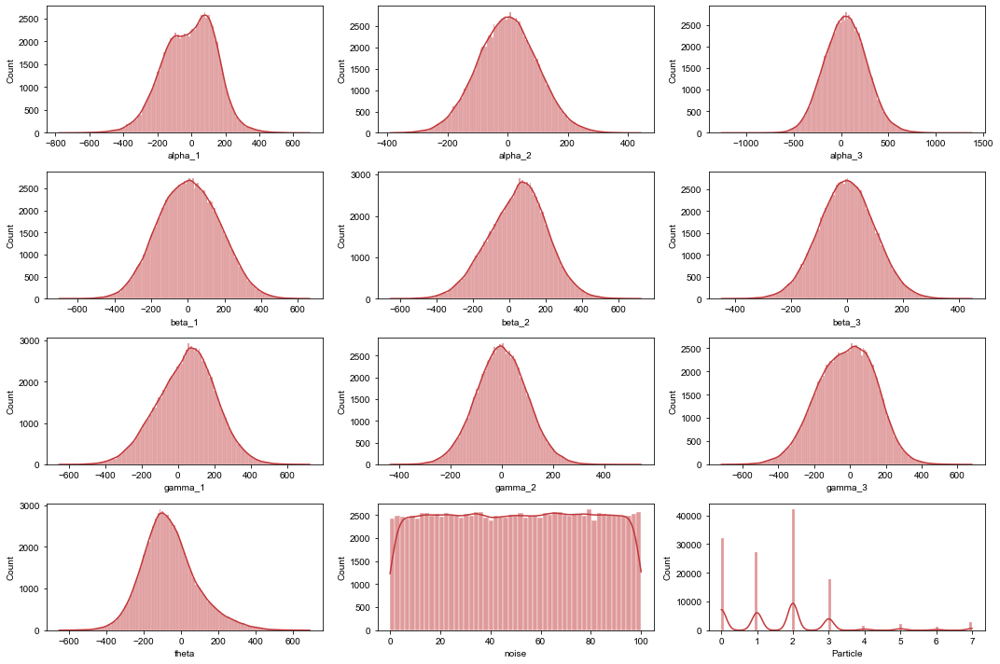

In [13]:
# Visualización Histogramas 
filas=4
columnas=3

# Creación Figuras, axes y estilo.
fig, axes = plt.subplots(filas, columnas, figsize=(15, 10),tight_layout=True)
sns.set_style("darkgrid")
sns.set_palette('RdGy')

# Plot histogramas
for i in range(filas):
    for j in range(columnas):
        var=(+j)+(i*columnas)
        sns.histplot(ax = axes[i, j], 
                     data = df,  
                     x = df.columns[var],
                     kde = True,
                     alpha = 0.5)
        

---

- Si observamos la distribución de cada variable, podemos decir que todas la variables menos _noise_ tienen valores de kurtosis y asimetría (skewness) muy próximos a cero.

- El rango de las variables está en una escala de valores bastante similar.

- La variable ruido se asemeja a una distribución uniforme entre 0 y 100.

- _Particle_ es nuestra target o variable independiente. Es una variable categórica con 8 clases, si observamos la distribución de las clases vemos que **no está balanceada** donde tenemos las clases 0,1,2 y 3 como mayoritarias que suponen un 93.7 % del total de observaciones. 

---

In [21]:
# Distribucion del %clases en el dataset
(df.Particle.value_counts(normalize=True)*100).round(2).sort_index()

0    25.29
1    21.47
2    33.03
3    13.92
4     1.34
5     1.78
6     0.92
7     2.24
Name: Particle, dtype: float64

---

### 2.2.2. Análisis multivariable.

Relativo a la correlación entre variables, podemos ver la matriz de correlación:

---

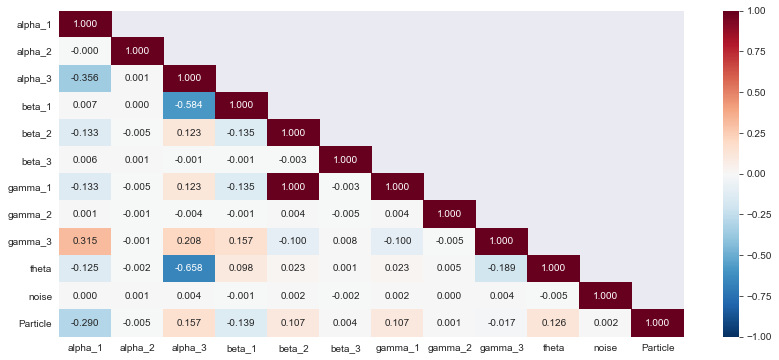

In [16]:
# Matriz de correlación de las variables numéricas
#---------------------------------------------------------------------------
fig, axes = plt.subplots(figsize=(14, 6))

sns.heatmap(df.corr(),
           vmin=-1.0,
           vmax=1.0,
           annot=True, fmt='.3f',
           mask=np.tri(len(df.corr()),len(df.corr()),k=-1,dtype=bool).T,
           cmap='RdBu_r');

--- 

- *gamma_1* y *beta_2* tienen una correlación cercana a 1. De hecho si comparamos los valores uno a uno ambas variables son iguales en 127.131 observaciones. Es decir, siempre que se recoge un valor de beta_2 éste es igual al valor de gamma_1.


---

In [16]:
# Total de valores de gamma_1 y beta_2 
(df.gamma_1 == df.beta_2).sum()

127131

---

- *alpha_3* presenta una correlación negativa media con *theta* y *beta_1* y una correlación negativa baja con *alpha_1*.

---

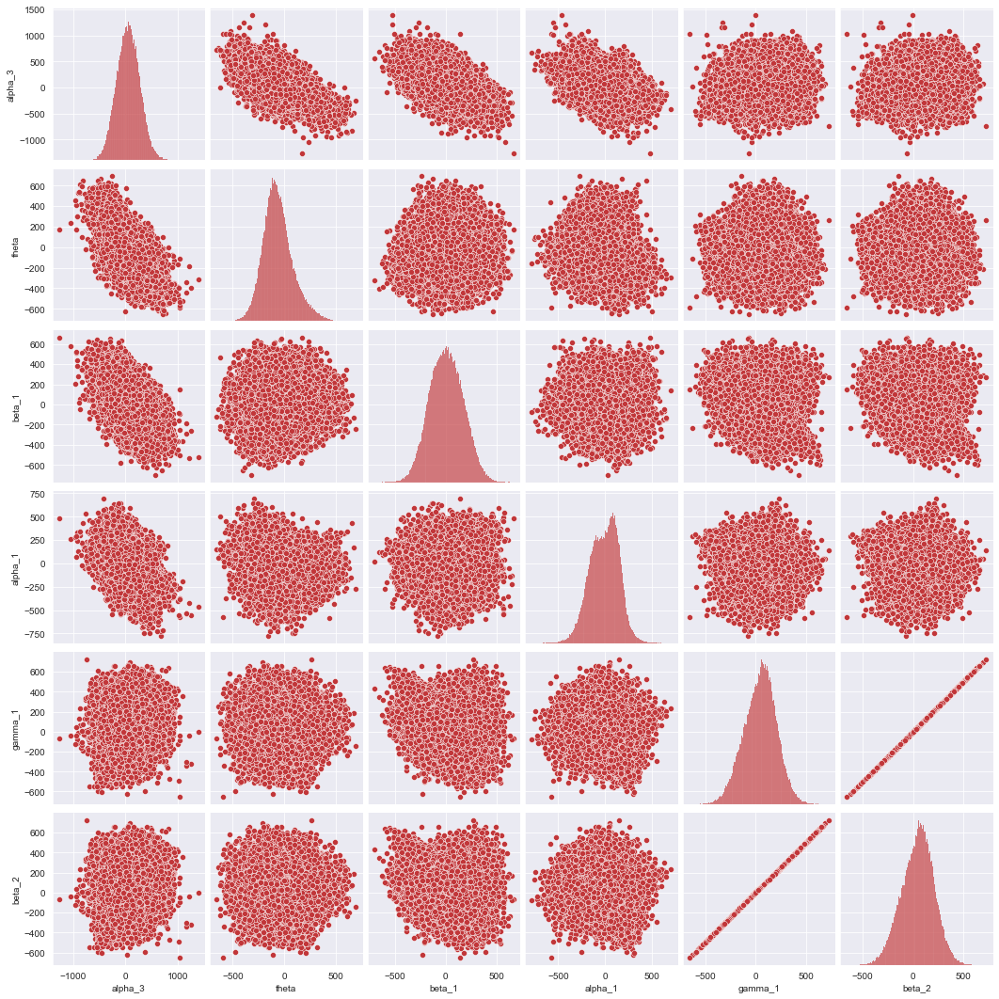

In [17]:
# Conjunto de representacioes de las variables con mayor correlación

sns.pairplot(df[['alpha_3','theta','beta_1','alpha_1','gamma_1','beta_2']]);

---

# 3. Modelado y entrenamiento.

Mi flujo de trabajo va a ser: 

1. Dividir dataset en train y test.
 
2. Entrenamiento de modelos.
    Voy a trabajar con una muestra del 10 %, con objeto de reducir el tiempo de computación. En esta fase voy a entrenar tres modelos diferentes y probar algunas técnicas de tratamiento de datasets no balanceados. El objeto es hacer una preselección del modelo que mejor se comporte. 
  
 1. Entrenamiento con los **datos originales**.
   
 2. Entrenamiento con un **under-sampling** de las clases mayoritarias.
   
 3. Entrenamiento con un **over-sampling** clases minoritarias (SMOTE) y **under-sampling** del dataset remuestreado (Tomek links o Edited Nearest Neighbours).

3. Selección del modelo con mejor F1-Score y entrenamiento con el conjunto completo de entrenamiento.

4. Evaluación con el conjunto de test.

Como el tiempo es ajustado, tan solo evaluaré tres modelos, regresión logística, random forest y XGBoost.

Para entrenar los modelos utilizaré validación cruzada con 5 folds.



## 3.1. Preparación del dataset para entrenar.

En primer lugar divido el dataset en una parte de entrenamiento y otra de test. Voy a hacer una división 80/20.

---

In [6]:
# División train / test
df_train, df_test = train_test_split(df,
                                     test_size = 0.2,
                                     random_state = 1984)


In [7]:
# Muestra para fase de preselección
df_sample = df.sample(frac=0.1, random_state = 1984)  ## OJO AQUÍ HAY DATA LEAKAGE DF DEBERÍA SER df_train

In [8]:
# Distribución de las clases en la muestra
df_sample.Particle.value_counts(normalize=True).sort_index()

0    0.253691
1    0.212928
2    0.337418
3    0.135957
4    0.013352
5    0.016887
6    0.008011
7    0.021756
Name: Particle, dtype: float64

--- 

Voy ahora a preparar _features y target_ para el entrenamiento.

Como *gamma_1 y beta_2* erán completamente iguales voy a retirar del modelo *beta_2*.

---


In [9]:
# Preparación de features y target.
X_train = df_sample.drop(columns = ['Particle','beta_2'])
y_train = df_sample.Particle

In [10]:
# Verifico como ha dividido train_test_split el dataset
y_train.value_counts(normalize=True).sort_index()

0    0.253691
1    0.212928
2    0.337418
3    0.135957
4    0.013352
5    0.016887
6    0.008011
7    0.021756
Name: Particle, dtype: float64

---

Por último creo una función llamada entrenamiento que me entrene los modelos, me guarde el mejor modelo y me devuelva un dataframe con los scores y los parámetros de los modelos.

---

In [30]:
def entrenamiento(diccionario_grid_search):
    '''Función que entrena los modelos incluidos en un diccionario.
        
        Args: 
            diccionario_grid_search: Diccionario con la siguiente estructura:
                clave: str. Nombre modelo
                valor: Lista con:
                            nombre modelo (str), grid_search_cv, X, y
        Return: 
            Dataframe con score.
        
        La función imprime en pantalla F1_Score y guarda los mejores modelos de cada grid_search
        
    '''
    lista_resultados =[]
    for clave, lista in diccionario_grid_search.items():
        print('Haciendo Grid Search de...', clave)
        nombre = lista[0]
        Grid_search = lista[1]
        X = lista[2]
        y = lista[3]
                
        # Training modelo
        Grid_search.fit(X, y)
        
        # Imprimir resultado
        print('F-1 Score Macro de ',nombre,': ',Grid_search.best_score_)
        
        # Adjuntar resultados a la lista
        resultado = [nombre,Grid_search.best_params_,Grid_search.best_score_]
        lista_resultados.append(resultado)
    
        # Guardar modelo    
        dump(Grid_search.best_estimator_,nombre)
    
    return pd.DataFrame(lista_resultados, columns =['Modelo','Parametros', 'F1-Macro'])
    


---

## 3.2. Entrenamiento con datos originales.

### 3.2.1. Regresión logística con X train,y train originales.

Voy a empezar haciendo una regresión logística utilizando X_train e y_train originales. Los valores nulos los imputaré con la mediana. Y utilizare una validación cruzada con 5 folds.  

---

In [12]:
# Modelo 01 // REGRESIÓN LOGÍSTICA 

modelo_01 = 'Regresión Logística'

# Pipeline

modelo_01_pipe = Pipeline(steps = [('Imputing', SimpleImputer()),
                                  ('Scaling', StandardScaler()),
                                  ('Logistic_regression', LogisticRegression(max_iter=500)),
                                  ])

# Hiper parameter tunning

modelo_01_hip = {'Imputing__strategy': ['median'],
               'Logistic_regression__penalty':['l2'],
               'Logistic_regression__C':[0.01,0.1, 1.0, 10.0],
               'Logistic_regression__fit_intercept':[False,True],}


# Grid_Search CV

modelo_01_GSCV = GridSearchCV(estimator = modelo_01_pipe,
                             param_grid = modelo_01_hip,
                             scoring = 'f1_macro',
                             n_jobs = -2,
                             cv = 5,
                             verbose = 3,)


---

### 3.2.2. Random Forest con X train,y train originales.

---

In [14]:
# Modelo 02 // RANDOM FOREST 

modelo_02 = 'Random Forest'

# Pipeline

modelo_02_pipe = Pipeline(steps = [('Imputing', KNNImputer(n_neighbors = 5)),
                                   ('clf', RandomForestClassifier()),
                                  ])

# Hiper parameter tunning

modelo_02_hip = {'clf__n_estimators': [150,200],
                 'clf__max_depth':[5,10],
                 'clf__max_features': [None],}


# Grid_Search CV

modelo_02_GSCV = GridSearchCV( estimator = modelo_02_pipe,
                              param_grid = modelo_02_hip,
                              scoring = 'f1_macro',
                              n_jobs = -1,
                              cv = 5,
                              verbose = 3,
                             )



---

### 3.2.3. XGBoost con X train, y train originales.

---



In [15]:
# Modelo 03 // XGBoost 

modelo_03 = 'XGBoost'


# Pipeline

modelo_03_pipe = Pipeline(steps = [('clf', xgb.XGBClassifier()),
                                  ])

# Hiper parameter tunning

modelo_03_hip = {'clf__n_estimators' :[100],
                'clf__max_depth' :[5,10],
                'clf__learning_rate' : [0.1,0.3],
                #'clf__booster':['gbtree','gblinear'] ,
                'clf__gamma':[0.1,1],
               }


# Grid_Search CV

modelo_03_GSCV = GridSearchCV(estimator = modelo_03_pipe,
                            param_grid = modelo_03_hip,
                            scoring = 'f1_macro',
                            n_jobs = -1,
                            cv = 5,
                            verbose = 3,)


---

### 3.2.4. Entrenamiento modelos con datos originales .

---

In [16]:
# Grid Search 
Grid_Search_inicial = {'modelo_01': [modelo_01,modelo_01_GSCV, X_train, y_train],
                       'modelo_02': [modelo_02,modelo_02_GSCV, X_train, y_train],
                       'modelo_03': [modelo_03,modelo_03_GSCV, X_train, y_train],}

In [31]:
# Training
Modelos_datos_originales = entrenamiento(Grid_Search_inicial)

Haciendo Grid Search de... modelo_01
Fitting 5 folds for each of 8 candidates, totalling 40 fits
F-1 Score Macro de  Regresión Logística :  0.2742168445777311
Haciendo Grid Search de... modelo_02
Fitting 5 folds for each of 4 candidates, totalling 20 fits
F-1 Score Macro de  Random Forest :  0.45089122322002034
Haciendo Grid Search de... modelo_03
Fitting 5 folds for each of 8 candidates, totalling 40 fits


C:\Users\iukan\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:51:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
F-1 Score Macro de  XGBoost :  0.46729167776972486


In [32]:
Modelos_datos_originales

,Modelo,Parametros,F1-Macro
0,Regresión Logística,"{'Imputing__strategy': 'median', 'Logistic_reg...",0.274217
1,Random Forest,"{'clf__max_depth': 10, 'clf__max_features': No...",0.450891
2,XGBoost,"{'clf__gamma': 0.1, 'clf__learning_rate': 0.3,...",0.467292


---

## 3.3. Undersampling de las clases mayoritarias.

Como tenemos un dataset bastante desbalanceado, voy a entrenar mi modelo haciendo un under-sampling aleatorio de las clases mayoritarias, esta técnica consiste en retirar aleatoriamente observaciones de la muestra mayoritaria para que las clases queden balanceadas. Como contrapartida tenemos una reducción del tamaño del dataset.

---

In [23]:
# Instancio el método de under_sampling aleatorio
rus = RandomUnderSampler(random_state = 1984)

# Transformo set de entrenamiento 
X_us, y_us = rus.fit_resample(X_train, y_train)


In [24]:
# Verifico la distribución de las clases
y_us.value_counts()

0    102
1    102
2    102
3    102
4    102
5    102
6    102
7    102
Name: Particle, dtype: int64

---

### 3.3.1. Regresión logística con undersampling.

---

In [25]:
# Modelo 011 // REGRESIÓN LOGÍSTICA entrenada con Undersampling del dataset

modelo_011 = 'Regresión Logística con undersamplig'

# Pipeline

modelo_011_pipe = Pipeline(steps = [('Imputing', SimpleImputer()),
                                  ('Scaling', StandardScaler()),
                                  ('Logistic_regression', LogisticRegression(max_iter=500)),
                                  ])

# Hiper parameter tunning

modelo_011_hip = {'Imputing__strategy': ['median'],
               'Logistic_regression__penalty':['l2'],
               'Logistic_regression__C':[0.01,0.1, 1.0, 10.0],
               'Logistic_regression__fit_intercept':[False,True],}


# Grid_Search CV

modelo_011_GSCV = GridSearchCV(estimator = modelo_011_pipe,
                               param_grid = modelo_011_hip,
                               scoring = 'f1_macro',
                               n_jobs = -2,
                               cv = 5,
                               verbose = 3,)


---

### 3.3.2. Random Forest con undersampling.

---

In [26]:
# Modelo 021 // RANDOM FOREST con under Sampling de la clase mayoritaria

modelo_021 = 'Random Forest con undersamplig'

# Pipeline

modelo_021_pipe = Pipeline(steps = [('Imputing', KNNImputer(n_neighbors = 5)),
                                   ('clf', RandomForestClassifier()),
                                  ])

# Hiper parameter tunning

modelo_021_hip = {'clf__n_estimators': [150,200],
                 'clf__max_depth':[3,5,10],
                 'clf__max_features': ['sqrt',None],}


# Grid_Search CV

modelo_021_GSCV = GridSearchCV( estimator = modelo_021_pipe,
                                param_grid = modelo_021_hip,
                                scoring = 'f1_macro',
                                n_jobs = -1,
                                cv = 5,
                                verbose = 3,)


### 3.3.3. XGBoost con undersampling.

In [27]:
# Modelo 031 // XGBoost con undersampling

modelo_031 = 'XGBoost con undersamplig'


# Pipeline

modelo_031_pipe = Pipeline(steps = [('clf', xgb.XGBClassifier()),
                                  ])

# Hiper parameter tunning

modelo_031_hip = {'clf__n_estimators' :[100],
                'clf__max_depth' :[5,10],
                'clf__learning_rate' : [0.1,0.2],
                #'clf__booster':['gbtree','gblinear'] ,
                'clf__gamma':[0.1,1],
               }


# Grid_Search CV

modelo_031_GSCV = GridSearchCV(estimator = modelo_031_pipe,
                               param_grid = modelo_031_hip,
                               scoring = 'f1_macro',
                               n_jobs = -1,
                               cv = 5,
                               verbose = 3,)


---

### 3.3.4. Entrenamiento de los modelos con undersampling de muestra.

---

In [33]:
# Grid Search
Grid_Search_underSamp = {'modelo_011': [modelo_011,modelo_011_GSCV, X_us, y_us],
                         'modelo_021': [modelo_021,modelo_021_GSCV, X_us, y_us],
                         'modelo_031': [modelo_031,modelo_031_GSCV, X_us, y_us],}

In [34]:
# Training
Modelos_datos_underSamp = entrenamiento(Grid_Search_underSamp)

Haciendo Grid Search de... modelo_011
Fitting 5 folds for each of 8 candidates, totalling 40 fits
F-1 Score Macro de  Regresión Logística - UnderSampling :  0.3177494481666602
Haciendo Grid Search de... modelo_021
Fitting 5 folds for each of 12 candidates, totalling 60 fits
F-1 Score Macro de  Random Forest - Undersampling :  0.44246019133898207
Haciendo Grid Search de... modelo_031
Fitting 5 folds for each of 8 candidates, totalling 40 fits


C:\Users\iukan\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:52:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
F-1 Score Macro de  XGBoost con undersamplig :  0.3897487329878323


In [35]:
Modelos_datos_underSamp

,Modelo,Parametros,F1-Macro
0,Regresión Logística - UnderSampling,"{'Imputing__strategy': 'median', 'Logistic_reg...",0.317749
1,Random Forest - Undersampling,"{'clf__max_depth': 10, 'clf__max_features': 's...",0.442460
2,XGBoost con undersamplig,"{'clf__gamma': 1, 'clf__learning_rate': 0.1, '...",0.389749


---

## 3.4. Oversampling - Undersampling de las clases mayoritarias.

En esta ocasión voy a probar si consigo mejorar combinando un oversampling de las clases minoritarias con un SMOTE y seguido de un undersampling con el método Tomek Links. 

---

In [47]:
# Imputo la mediana a los valores nulos
imputer = SimpleImputer(strategy = 'median')

X_train = imputer.fit_transform(X_train)

In [48]:
# Instancio método de remuestreo y limpieza
smote_tomek = SMOTETomek(random_state = 1984)

# Transformo set de entrenamiento
X_resampled, y_resampled = smote_tomek.fit_resample(X_train, y_train)

In [49]:
y_resampled.value_counts()

5    4296
6    4294
4    4289
7    4288
3    4267
0    4207
1    4198
2    4163
Name: Particle, dtype: int64

---

### 3.4.1. Regresión logística con remuestreo SMOTE-Tomek links del dataset entrenamiento.

---

In [148]:
# Modelo 012 // REGRESIÓN LOGÍSTICA entrenada con SMOTE-Tomek links del dataset

modelo_012 = 'Regresión Logística con SMOTE-Tomek links'

# Pipeline

modelo_012_pipe = Pipeline(steps = [('Imputing', SimpleImputer()),
                                  ('Scaling', StandardScaler()),
                                  ('Logistic_regression', LogisticRegression(max_iter=500)),
                                  ])

# Hiper parameter tunning

modelo_012_hip = {'Imputing__strategy': ['median'],
               'Logistic_regression__penalty':['l2'],
               'Logistic_regression__C':[0.01,1.0],
               'Logistic_regression__fit_intercept':[False,True],}


# Grid_Search CV

modelo_012_GSCV = GridSearchCV(estimator = modelo_012_pipe,
                               param_grid = modelo_012_hip,
                               scoring = 'f1_macro',
                               n_jobs = -2,
                               cv = 5,
                               verbose = 3,)


---

### 3.4.2. Random Forest con remuestreo SMOTE-Tomek links del dataset entrenamiento.

---

In [147]:
# Modelo 022 // RANDOM FOREST entrenado con SMOTE-Tomek links del dataset


modelo_022 = 'Random Forest con SMOTE-Tomek links'

# Pipeline

modelo_022_pipe = Pipeline(steps = [('Imputing', KNNImputer(n_neighbors = 5)),
                                   ('clf', RandomForestClassifier()),
                                  ])

# Hiper parameter tunning

modelo_022_hip = {'clf__n_estimators': [150,200],
                 'clf__max_depth':[5,10],
                 'clf__max_features': ['sqrt',None],}


# Grid_Search CV

modelo_022_GSCV = GridSearchCV( estimator = modelo_022_pipe,
                                param_grid = modelo_022_hip,
                                scoring = 'f1_macro',
                                n_jobs = -1,
                                cv = 5,
                                verbose = 3,)


---

### 3.4.3. Regresión logística con remuestreo SMOTE-Tomek links del dataset entrenamiento.

---

In [146]:
# Modelo 032 // XGBoost entrenada con SMOTE-Tomek links del dataset


modelo_032 = 'XGBoost con SMOTE-Tomek links'


# Pipeline

modelo_032_pipe = Pipeline(steps = [('clf', xgb.XGBClassifier()),
                                  ])

# Hiper parameter tunning

modelo_032_hip = {'clf__n_estimators' :[100],
                'clf__max_depth' :[5,10],
                'clf__learning_rate' : [0.1,0.2],
                #'clf__booster':['gbtree','gblinear'] ,
                'clf__gamma':[0.1,0.5,],
               }


# Grid_Search CV

modelo_032_GSCV = GridSearchCV(estimator = modelo_032_pipe,
                               param_grid = modelo_032_hip,
                               scoring = 'f1_macro',
                               n_jobs = -1,
                               cv = 5,
                               verbose = 3,)


---

### 3.4.4. Regresión logística con remuestreo SMOTE-Edited Nearest Neighbours del dataset entrenamiento.

---

In [53]:
# Instancio método de remuestreo y limpieza
smote_een = SMOTEENN(random_state = 1984)

# Transformo set de entrenamiento
X_resampledEEN, y_resampledEEN = smote_een.fit_resample(X_train, y_train)

In [54]:
y_resampledEEN.value_counts()

6    4256
4    4208
5    4202
7    4171
3    3398
0    2379
1    2364
2    1524
Name: Particle, dtype: int64

In [145]:
# Modelo 033 // XGBoost entrenada con SMOTE-EEN del dataset


modelo_033 = 'XGBoost con SMOTE-EEN del dataset'


# Pipeline

modelo_033_pipe = Pipeline(steps = [('clf', xgb.XGBClassifier()),
                                  ])

# Hiper parameter tunning

modelo_033_hip = {'clf__n_estimators' :[100],
                'clf__max_depth' :[5,10],
                'clf__learning_rate' : [0.1,0.2],
                #'clf__booster':['gbtree','gblinear'] ,
                'clf__gamma':[0.1,0.5,],
               }


# Grid_Search CV

modelo_033_GSCV = GridSearchCV(estimator = modelo_033_pipe,
                               param_grid = modelo_033_hip,
                               scoring = 'f1_macro',
                               n_jobs = -1,
                               cv = 5,
                               verbose = 3,)


In [120]:
modelo_033_GSCV.best_params_

{'clf__gamma': 0.1,
 'clf__learning_rate': 0.3,
 'clf__max_depth': 10,
 'clf__n_estimators': 100}

---

### 3.4.5. Entrenamiento de modelos con remuestreo SMOTE y undersampling.

---

In [149]:
Grid_Search_SMOTE_TL = {'modelo_012': [modelo_012,modelo_012_GSCV, X_resampled,y_resampled],
                        'modelo_022': [modelo_022,modelo_022_GSCV, X_resampled,y_resampled],
                        'modelo_032': [modelo_032,modelo_032_GSCV, X_resampled,y_resampled],
                        'modelo_033': [modelo_033,modelo_033_GSCV, X_resampledEEN,y_resampledEEN]}


In [150]:
# Training
Modelos_datos_SMOTE_TL = entrenamiento(Grid_Search_SMOTE_TL)

Haciendo Grid Search de... modelo_012
Fitting 5 folds for each of 4 candidates, totalling 20 fits
F-1 Score Macro de  Regresión Logística con SMOTE-Tomek links :  0.3569809301679091
Haciendo Grid Search de... modelo_022
Fitting 5 folds for each of 8 candidates, totalling 40 fits
F-1 Score Macro de  Random Forest con SMOTE-Tomek links :  0.768740799098169
Haciendo Grid Search de... modelo_032
Fitting 5 folds for each of 8 candidates, totalling 40 fits


C:\Users\iukan\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:04:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
F-1 Score Macro de  XGBoost con SMOTE-Tomek links :  0.9017694790388647
Haciendo Grid Search de... modelo_033
Fitting 5 folds for each of 8 candidates, totalling 40 fits


C:\Users\iukan\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:14:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
F-1 Score Macro de  XGBoost con SMOTE-EEN del dataset :  0.9480729088776393


In [153]:
Modelos_datos_SMOTE_TL

,Modelo,Parametros,F1-Macro
0,Regresión Logística con SMOTE-Tomek links,"{'Imputing__strategy': 'median', 'Logistic_reg...",0.356981
1,Random Forest con SMOTE-Tomek links,"{'clf__max_depth': 10, 'clf__max_features': 's...",0.768741
2,XGBoost con SMOTE-Tomek links,"{'clf__gamma': 0.1, 'clf__learning_rate': 0.2,...",0.901769
3,XGBoost con SMOTE-EEN del dataset,"{'clf__gamma': 0.1, 'clf__learning_rate': 0.2,...",0.948073


---

## 3.5. Comparación de los diferentes modelos.

Veamos los resultados totales a continuación:

---

In [154]:
pd.concat([Modelos_datos_originales,
           Modelos_datos_underSamp,
           Modelos_datos_SMOTE_TL]).sort_values(by = 'F1-Macro', ascending = False)

,Modelo,Parametros,F1-Macro
3,XGBoost con SMOTE-EEN del dataset,"{'clf__gamma': 0.1, 'clf__learning_rate': 0.2,...",0.948073
2,XGBoost con SMOTE-Tomek links,"{'clf__gamma': 0.1, 'clf__learning_rate': 0.2,...",0.901769
1,Random Forest con SMOTE-Tomek links,"{'clf__max_depth': 10, 'clf__max_features': 's...",0.768741
2,XGBoost,"{'clf__gamma': 0.1, 'clf__learning_rate': 0.3,...",0.467292
1,Random Forest,"{'clf__max_depth': 10, 'clf__max_features': No...",0.450891
1,Random Forest - Undersampling,"{'clf__max_depth': 10, 'clf__max_features': 's...",0.442460
2,XGBoost con undersamplig,"{'clf__gamma': 1, 'clf__learning_rate': 0.1, '...",0.389749
0,Regresión Logística con SMOTE-Tomek links,"{'Imputing__strategy': 'median', 'Logistic_reg...",0.356981
0,Regresión Logística - UnderSampling,"{'Imputing__strategy': 'median', 'Logistic_reg...",0.317749
0,Regresión Logística,"{'Imputing__strategy': 'median', 'Logistic_reg...",0.274217


El modelo que mejor se comporta es un XGBoost cuando lo entreno con un conjunto de datos al que le he aplicado un remuestreo de las clases minoritarias (SMOTE) y un posterior tratamiento de reducción del número de muestras.

En general hay una mejora de los rendimientos al aplicar técnicas típicas de datasets balanceados, así vemos como la regresión logística siempre mejora, mientras que Random Forest y XGBoost se quedan casi igual cuando hacemos un undersampling de las clases mayoritarias. Sinembargo donde hay un gran salto de rendimiento es al combinar Oversampling con muestras sintéticas (SMOTE) con under sampling.

---

## 3.6. Entrenamiento modelo preseleccionado. XGBoost / SMOTE-EEN

Vemos que el mejor modelo a sido XGBoost tratando previamente el dataset de entrenamiento con un remuestreo SMOTE y posteriormente limpiado con el método "Edited Nearest Neighbours".

Vamos a utilizar este modelo con el conjunto de datos de entrenamiento completo y terminaremos ajustando los hiperparámetros un poco más en profundidad.

---

In [86]:
# Preparación de features y target.
X_train_completo = df_train.drop(columns = ['Particle','beta_2'])
y_train_completo = df_train.Particle

In [87]:
# Distribución clases
y_train_completo.value_counts()

2    33612
0    25682
1    21907
3    14257
7     2270
5     1814
4     1356
6      958
Name: Particle, dtype: int64

In [88]:
# Imputo la mediana a los valores nulos
imputer = SimpleImputer(strategy = 'median')

X_train_completo = imputer.fit_transform(X_train_completo)

Ahora transformo el dataset haciendo oversampling / undersampling:

In [89]:
# Instancio método de remuestreo y limpieza
smote_een = SMOTEENN(random_state = 1984)

# Transformo set de entrenamiento
X_resampled_completo, y_resampled_completo = smote_een.fit_resample(X_train_completo, 
                                                                    y_train_completo)

In [90]:
y_resampled_completo.value_counts()

6    33232
4    33055
7    32985
5    32976
3    26635
0    19679
1    19125
2    13246
Name: Particle, dtype: int64

Por último entreno el modelo 4.

In [91]:
# Modelo 04 // XGBoost entrenada con SMOTE-Tomek links del dataset

modelo_04 = 'XGBoost con SMOTE-EEN'


# Pipeline

modelo_04_pipe = Pipeline(steps = [('clf', xgb.XGBClassifier()),
                                  ])

# Hiper parameter tunning

modelo_04_hip = {'clf__n_estimators' :[100],
                'clf__max_depth' :[10],
                'clf__learning_rate' : [0.2],
                #'clf__booster':['gbtree','gblinear'] ,
                'clf__gamma':[0.1,],
               }


# Grid_Search CV

modelo_04_GSCV = GridSearchCV(estimator = modelo_04_pipe,
                              param_grid = modelo_04_hip,
                              scoring = 'f1_macro',
                              n_jobs = -1,
                              cv = 5,
                              verbose = 3,)


In [92]:
modelo_04_GSCV.fit(X_resampled_completo,y_resampled_completo)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


C:\Users\iukan\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:12:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('clf',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                                      importance_type='gain',
                                                      interaction_constraints=None,
                                                      learning_rate=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      min_child_weight=None,
                          

In [93]:
modelo_04_GSCV.best_score_

0.9213954642101376

In [94]:
# Guardo el modelo
dump(modelo_04_GSCV.best_estimator_,'modelo_final.joblib')

['modelo_final.joblib']

In [95]:
modelo_final = modelo_04_GSCV.best_estimator_

---

## 3.7. Evaluación modelo final.

Ha llegado el momento de coger el conjunto de datos de test que obtuve en el punto 3.1. y evaluar como predice nuestro modelo con estos datos.

Para ello tengo que preparar los datos siguiendo el mismo proceso que hice para el entrenamiento.

Elimino beta_2.

### 3.7.1.  Modelo 04. XGBoost / SMOTE-EEN.

---


In [96]:
# Preparación del conjunto de test

X_test = df_test.drop(columns = ['Particle','beta_2'])
y_test = df_test.Particle


---

E imputo la mediana con el SimpleImputer que utilicé en el paso anterior:

---



In [99]:
# Imputo variables
X_test_imputacion = imputer.transform(X_test)

---

Una vez que los datos de test están preparados, utilizo el método _predict_ para hacer las prediciones con el modelo.

---

In [100]:
# Predicción con el modelo ganador. 
y_test_pred = modelo_final.predict(X_test_imputacion)


# Valores reales de las clases de vino en el conjunto de test.
y_test


2853      0
113056    1
43656     3
120949    1
27940     2
         ..
106367    3
42804     2
27041     1
124886    0
17848     2
Name: Particle, Length: 25465, dtype: int64

In [103]:
# Evaluación de F1-Macro en el conjunto de test.

Test_Score = f1_score(y_true = y_test, 
                      y_pred = y_test_pred, 
                      average='macro')


print('El modelo tiene un F1 score - Macro en el conjunto de test de %s' % Test_Score)



El modelo tiene un F1 score - Macro en el conjunto de test de 0.4769883257120625


In [104]:
print(classification_report(y_true = y_test,
                            y_pred = y_test_pred))

              precision    recall  f1-score   support

           0       0.85      0.77      0.81      6515
           1       0.74      0.68      0.71      5433
           2       0.90      0.59      0.71      8448
           3       0.65      0.81      0.72      3470
           4       0.10      0.34      0.15       348
           5       0.22      0.51      0.31       455
           6       0.03      0.17      0.06       212
           7       0.24      0.58      0.34       584

    accuracy                           0.68     25465
   macro avg       0.47      0.56      0.48     25465
weighted avg       0.77      0.68      0.71     25465



---

El modelo a pasado de un score de 0,921 a 0,477, tenemos un problema de **overfitting**.


### 3.7.2. Evaluación de modelos alternativos.

Voy a probar como se comportan los modelos entrenados con SMOTE+Tomek links y la muestra del 10 % del conjunto de train.

A continuación revisaremos modelo_032 y modelo_033. 

#### 3.7.2.1. Modelo_032. XGBoost + SMOTE+Tomek links y la muestra del 10 %.

---

In [119]:
# Cargo el modelo
modelo_032_est = load('XGBoost con SMOTE-Tomek links del dataset')

In [120]:
# Predicciones test 
y_test_pred_mod32 = modelo_032_est.predict(X_test_imputacion)

In [121]:
# F1 macro Score
Test_Score_modelo32 = f1_score(y_true = y_test, 
                      y_pred = y_test_pred2, 
                      average='macro')

In [122]:
print('El modelo tiene un F1 score - Macro en el conjunto de test de %s' % Test_Score_modelo32)


El modelo tiene un F1 score - Macro en el conjunto de test de 0.7040467822568983


In [123]:
print(classification_report(y_true = y_test,
                            y_pred = y_test_pred_mod32))

              precision    recall  f1-score   support

           0       0.89      0.90      0.90      6515
           1       0.82      0.83      0.83      5433
           2       0.90      0.83      0.86      8448
           3       0.79      0.86      0.82      3470
           4       0.52      0.57      0.55       348
           5       0.56      0.63      0.59       455
           6       0.41      0.52      0.46       212
           7       0.57      0.68      0.62       584

    accuracy                           0.84     25465
   macro avg       0.68      0.73      0.70     25465
weighted avg       0.85      0.84      0.84     25465



---

Este modelo también tiene overfitting pero bastante menos, hemos pasado de 0,91 a 0,70 parece que Tomek links da mejor resultado que el undersampling con EEN.

Veamos como se comporta el modelo entrenado con Tomek y EEN con la muestra del 10%.

#### 3.7.2.2. Modelo_033. XGBoost  + SMOTE+EEN y la muestra del 10 %.


---

In [124]:
modelo_033_est = load('XGBoost con SMOTE-EEN del dataset')

In [126]:
# Predicciones del test
y_test_pred_mod33 = modelo_033_est.predict(X_test_imputacion)

# F1 Score Macro
Test_Score_modelo33 = f1_score(y_true = y_test, 
                               y_pred = y_test_pred_mod33, 
                               average='macro')
print('El modelo tiene un F1 score - Macro en el conjunto de test de %s' % Test_Score_modelo33)

El modelo tiene un F1 score - Macro en el conjunto de test de 0.5170432369993088


In [128]:
print(classification_report(y_true = y_test,
                            y_pred = y_test_pred_mod33))

              precision    recall  f1-score   support

           0       0.85      0.74      0.79      6515
           1       0.71      0.68      0.70      5433
           2       0.91      0.54      0.68      8448
           3       0.61      0.83      0.71      3470
           4       0.19      0.60      0.29       348
           5       0.26      0.67      0.38       455
           6       0.12      0.56      0.20       212
           7       0.26      0.73      0.39       584

    accuracy                           0.67     25465
   macro avg       0.49      0.67      0.52     25465
weighted avg       0.77      0.67      0.70     25465



--- 

Efectivamente, parece que EEN me provoca mucho overfitting.

#### 3.7.2.3.  Modelo 05. XGBoost  + SMOTE+Tomek links y la dataset train completo.

Voy a reentrenar el **modelo_032** con todo el conjunto de datos a ver que resultados obtengo:

---

In [114]:
# Instancio método de remuestreo y limpieza
smote_tomek = SMOTETomek(random_state = 1984)

# Transformo set de entrenamiento
X_resampled_completo, y_resampled_completo = smote_tomek.fit_resample(X_train_completo, 
                                                                      y_train_completo)

In [117]:
# Modelo 05 // XGBoost entrenada con SMOTE-Tomek links del dataset


modelo_05 = 'XGBoost con SMOTE-Tomek'


# Pipeline

modelo_05_pipe = Pipeline(steps = [('clf', xgb.XGBClassifier()),
                                  ])

# Hiper parameter tunning

modelo_05_hip = {'clf__n_estimators' :[100],
                'clf__max_depth' :[10],
                'clf__learning_rate' : [0.2],
                #'clf__booster':['gbtree','gblinear'] ,
                'clf__gamma':[0.1,1],
               }


# Grid_Search CV

modelo_05_GSCV = GridSearchCV(estimator = modelo_05_pipe,
                              param_grid = modelo_05_hip,
                              scoring = 'f1_macro',
                              n_jobs = -1,
                              cv = 5,
                              verbose = 3,)


In [118]:
modelo_05_GSCV.fit(X_resampled_completo,y_resampled_completo)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


C:\Users\iukan\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:18:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('clf',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      gamma=None, gpu_id=None,
                                                      importance_type='gain',
                                                      interaction_constraints=None,
                                                      learning_rate=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      min_child_weight=None,
                          

In [129]:
modelo_05_GSCV.best_score_

0.8618532411684878

In [131]:
y_test_pred_mod_05 = (modelo_05_GSCV.best_estimator_).predict(X_test_imputacion)
Test_Score_modelo05 = f1_score(y_true = y_test, 
                               y_pred = y_test_pred_mod_05, 
                               average='macro')
print('El modelo tiene un F1 score - Macro en el conjunto de test de %s' % Test_Score_modelo05)

El modelo tiene un F1 score - Macro en el conjunto de test de 0.530769885211918


In [132]:
print(classification_report(y_true = y_test,
                            y_pred = y_test_pred_mod_05))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      6515
           1       0.77      0.72      0.74      5433
           2       0.85      0.77      0.81      8448
           3       0.71      0.79      0.75      3470
           4       0.17      0.27      0.21       348
           5       0.32      0.42      0.36       455
           6       0.06      0.14      0.08       212
           7       0.39      0.49      0.44       584

    accuracy                           0.76     25465
   macro avg       0.52      0.56      0.53     25465
weighted avg       0.78      0.76      0.77     25465



---

De nuevo cuando entrenamos el modelo con toda el dataset de entrenamiento tengo problemas de overfitting. Es decir, que parece que el modelo generaliza mejor cuando entrena con una muestra pequeña.

Por último para disminuir el overfitting voy a probar la técnica early stopping. Early stopping monitoriza el rendimiento del modelo que estamos entrenando en el conjunto de test y termina el entrenamiento cuando observa que no hay una mejora en el rendimiento.

#### 3.7.2.4. Modelo 06. XGBoost + SMOTE+Tomek links y la muestra 10 % dataset train con implantación early stopping.

El último modelo que probaré será una **implantación del early_stoping en el modelo 032**, que era un XGBoost entrenado con la muestra del diez por ciento,haciendo un SMOTE para compensar el desbalanceo de las clases y después un aclarado con Tomek links.

---


In [181]:
# Modelo 06 // XGBoost entrenada con SMOTE-Tomek links del dataset  con EARLY STOPPING


modelo_06 = 'XGBoost con SMOTE-Tomek + Sampling df_train + Early Stopping'
eval_set = [(X_test_imputacion, y_test)]

# Pipeline

modelo_06_pipe = Pipeline(steps = [('clf', xgb.XGBClassifier(early_stopping_rounds=10,
                                                             eval_metric="logloss",
                                                             eval_set=eval_set)),
                                  ])

# Hiper parameter tunning

modelo_06_hip = {'clf__n_estimators' :[300,],
                'clf__max_depth' :[5],
                'clf__learning_rate' : [0.1],
                'clf__booster':['gbtree','gblinear'] ,
                'clf__gamma':[0.1],
               }


# Grid_Search CV

modelo_06_GSCV = GridSearchCV(estimator = modelo_06_pipe,
                              param_grid = modelo_06_hip,
                              scoring = 'f1_macro',
                              n_jobs = -1,
                              cv = 5,
                              verbose = 3,)


In [182]:
# Recupero X, y con los que entrenamos modelo 032
X_mod06 = X_resampled
y_mod06 = y_resampled

In [183]:
# Entreno modelo
modelo_06_GSCV.fit(X_mod06,
                   y_mod06)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


C:\Users\iukan\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:18:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { early_stopping_rounds, eval_set } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('clf',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      early_stopping_rounds=10,
                                                      eval_metric='logloss',
                                                      eval_set=[(array([[   2.077144  ,  -61.69779794,  113.5138339 , ..., -526.1186327 ,
        -133.5105645 ,   16.88561643],
       [ -21.20086496, -199.7645484 ,  177.9248492 , ...,   83....
                                                      num_parallel_tree=None,
                                                      random_state=None,
           

In [184]:
modelo_06_GSCV.best_score_

0.8215847914408639

In [185]:
modelo_06_GSCV.best_params_

{'clf__booster': 'gbtree',
 'clf__gamma': 0.1,
 'clf__learning_rate': 0.1,
 'clf__max_depth': 5,
 'clf__n_estimators': 300}

In [186]:
y_test_pred_mod_06 = (modelo_06_GSCV.best_estimator_).predict(X_test_imputacion)
Test_Score_modelo06 = f1_score(y_true = y_test, 
                               y_pred = y_test_pred_mod_06, 
                               average='macro')
print('El modelo tiene un F1 score - Macro en el conjunto de test de %s' % Test_Score_modelo06)

El modelo tiene un F1 score - Macro en el conjunto de test de 0.5620769116358701


#### 3.7.2.5. Modelo 022. Random Forest + SMOTE+Tomek links y la muestra 10 % dataset train.

Voy a probar como generalizaría un Random forest, en concreto el modelo_022.


In [155]:
# Cargo modelo
modelo_022_est = load('Random Forest con SMOTE-Tomek links')

In [156]:
# Predicciones del test
y_test_pred_mod_022 = modelo_022_est.predict(X_test_imputacion)

# F1 Score Macro
Test_Score_modelo_022 = f1_score(y_true = y_test, 
                               y_pred = y_test_pred_mod_022, 
                               average='macro')
print('El modelo tiene un F1 score - Macro en el conjunto de test de %s' % Test_Score_modelo_022)

El modelo tiene un F1 score - Macro en el conjunto de test de 0.5509006070553396


In [158]:
print(classification_report(y_true = y_test, 
                            y_pred = y_test_pred_mod_022,))

              precision    recall  f1-score   support

           0       0.85      0.80      0.82      6515
           1       0.73      0.68      0.71      5433
           2       0.87      0.66      0.75      8448
           3       0.62      0.78      0.69      3470
           4       0.26      0.57      0.36       348
           5       0.31      0.62      0.41       455
           6       0.20      0.53      0.29       212
           7       0.28      0.62      0.38       584

    accuracy                           0.71     25465
   macro avg       0.51      0.66      0.55     25465
weighted avg       0.76      0.71      0.73     25465



Este modelo también presenta overfitting.

## 3.8. Modelo final. 

Después de realizar algunos ensayos hemos visto que el modelo que mejor predice las partículas generadas es el **modelo_032: XGBoost / SMOTE-Tomek-Links - Entrenado sobre muestra 10% Train test.**


In [151]:
modelo_032_est

Pipeline(steps=[('clf',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=0.1, gpu_id=-1,
                               importance_type='gain',
                               interaction_constraints='', learning_rate=0.2,
                               max_delta_step=0, max_depth=10,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=100,
                               n_jobs=8, num_parallel_tree=1,
                               objective='multi:softprob', random_state=0,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
                               subsample=1, tree_method='exact',
                               validate_parameters=1, verbosity=None))])

In [152]:
print(classification_report(y_true = y_test,
                            y_pred = y_test_pred_mod32))

              precision    recall  f1-score   support

           0       0.89      0.90      0.90      6515
           1       0.82      0.83      0.83      5433
           2       0.90      0.83      0.86      8448
           3       0.79      0.86      0.82      3470
           4       0.52      0.57      0.55       348
           5       0.56      0.63      0.59       455
           6       0.41      0.52      0.46       212
           7       0.57      0.68      0.62       584

    accuracy                           0.84     25465
   macro avg       0.68      0.73      0.70     25465
weighted avg       0.85      0.84      0.84     25465

